# DV8 seasonal standard deviation

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import dask
import cartopy.feature as cfeature
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
import intake
import cartopy.crs as ccrs
from tempfile import TemporaryDirectory
from getpass import getuser
from pathlib import Path
from dask.distributed import Client, LocalCluster
import subprocess
import re
import cartopy.crs as ccrs
import warnings
warnings.filterwarnings('ignore')
import sys
sys.path.append('/home/b/b382616/notebooks_home/MHW/spot_the_blob')

import spot_the_blOb.hot_to_blOb as hot

import dask
from dask.distributed import Client, LocalCluster
import bokeh

dask.config.config.get('distributed').get('dashboard').update({'link':'{JUPYTERHUB_SERVICE_PREFIX}/proxy/{port}/status'})
cluster = LocalCluster(n_workers=32, threads_per_worker=4)
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/b382616/levante-spawner-preset//proxy/8787/status,
Dashboard: /user/b382616/levante-spawner-preset//proxy/8787/status,Workers: 32
Total threads: 128,Total memory: 235.37 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:41951,Workers: 32
Dashboard: /user/b382616/levante-spawner-preset//proxy/8787/status,Total threads: 128
Started: Just now,Total memory: 235.37 GiB
Comm: tcp://127.0.0.1:36655,Total threads: 4
Dashboard: /user/b382616/levante-spawner-preset//proxy/42095/status,Memory: 7.36 GiB
Nanny: tcp://127.0.0.1:46279,


In [6]:
file_name = Path('/scratch') / getuser()[0] / getuser() / 'mhws' / 'extremes_hob_OSTIA.zarr'
chunk_size = {'time': 25, 'lat': -1, 'lon': -1}
ds = xr.open_zarr(str(file_name), chunks=chunk_size)
ssta=ds['dat_anomaly']

In [ ]:
# OBSERVATION
cat = intake.open_catalog("https://raw.githubusercontent.com/eerie-project/intake_catalogues/main/eerie.yaml")

dat = cat['dkrz.disk.observations.OSTIA.OSTIA.daily']#-output'][model][expid][version]['ocean'][gridspec]
#sst = dat(chunks={}).to_dask()
#sst=sst['sst'].coarsen(lat=5, lon=5,boundary='pad').mean()
#sst=sst.isel(time=slice(0,13879))
#extreme_events_ds = hot.preprocess_data(sst,detrend_orders=[1,2], std_normalise=False, threshold_percentile=95)
#ssta_ic=extreme_events_ds['dat_anomaly']


## one point audrey vs me

In [32]:

point = ssta.sel(lat=0, lon=-100, method='nearest')

# winter Audrey
aud_win = xr.concat([
    point.groupby('time.month')[12],
    point.groupby('time.month')[1],
    point.groupby('time.month')[2]
], dim='time').std(dim='time').values

# winter Emma
point_season_year = point.assign_coords(
    season_year = xr.where(
        point['time'].dt.month == 12,
        point['time'].dt.year + 1,
        point['time'].dt.year
    )
)

ssta_djf = point_season_year.sel(time=point_season_year['time'].dt.month.isin([12,1,2]))
std_season = ssta_djf.groupby('season_year').std(dim='time')
std_clim = std_season.mean(dim='season_year').values

print(f"Method Audrey winter (DJF) at point of lat=0,lon=-100 : {aud_win}")
print(f"Method Emma winter (DJF) at point of lat=0,lon=-100: {std_clim}")
point = ssta.sel(lat=0, lon=-100, method='nearest')

# Audrey summer
aud_summ = xr.concat([
    point.groupby('time.month')[6],
    point.groupby('time.month')[7],
    point.groupby('time.month')[8]
], dim='time').std(dim='time').values

# emma summer
point_season_year = point.assign_coords(
    season_year = xr.where(
        point['time'].dt.month == 12,
        point['time'].dt.year + 1,
        point['time'].dt.year
    )
)

ssta_jja = point_season_year.sel(time=point_season_year['time'].dt.month.isin([6,7,8]))
std_season = ssta_jja.groupby('season_year').std(dim='time')
std_clim = std_season.mean(dim='season_year').values

print(f"Method Audrey summer (JJA) at point of lat=0,lon=-100: {aud_summ}")
print(f"Method Emma summer (JJA) at point of lat=0,lon=-100: {std_clim}")


Method Audrey winter (DJF) at point of lat=0,lon=-100 : 1.750457525253296
Method Emma winter (DJF) at point of lat=0,lon=-100: 1.0181607007980347
Method Audrey summer (JJA) at point of lat=0,lon=-100: 1.646841049194336
Method Emma summer (JJA) at point of lat=0,lon=-100: 0.9743073582649231


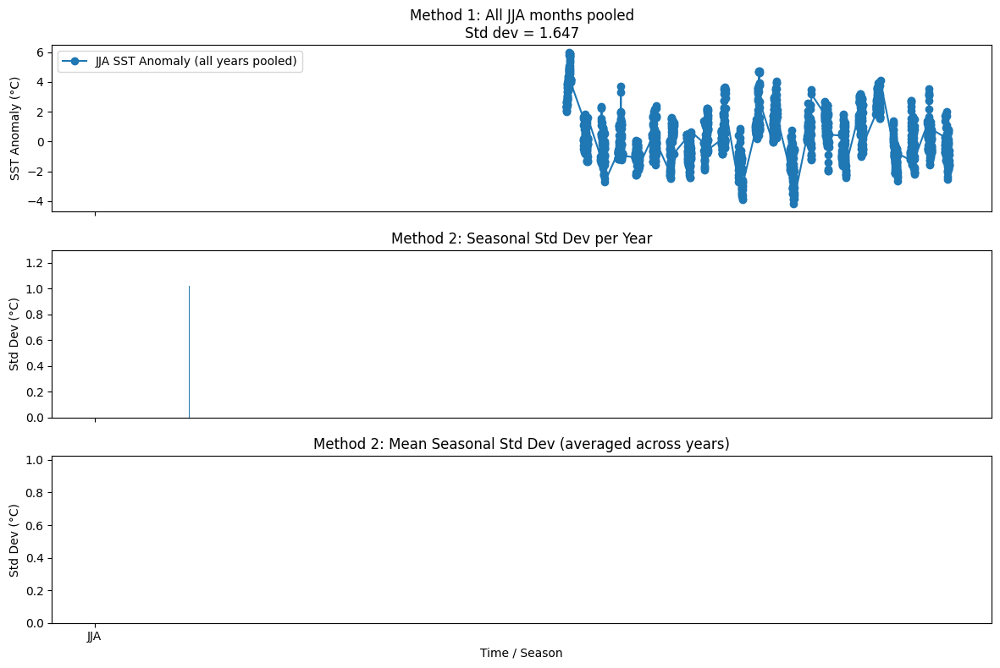

# Seasonal SDV

## OBS

In [8]:
#this groups by months (so e.g. for year 1982 it takes dec,jan,feb, of 1982 instead of doing dec 1982 and then jan,feb 1983)
# Define trimesters and their months
trimesters = {
    'DJF': [12, 1, 2],
    'MAM': [3, 4, 5],
    'JJA': [6, 7, 8],
    'SON': [9, 10, 11]
}

# Calculate and save trimester standard deviations
for trm, months in trimesters.items():
    # Mask months while handling December (year boundary)
    ssta_trm = ssta.sel(time=ssta.time.dt.month.isin(months))
    std_trm = ssta_trm.std(dim='time', keep_attrs=True)
    std_trm=std_trm.to_netcdf(f'ssta_std_obs_{trm}.nc')



/home/b/b382616/opt/anaconda3/envs/py310_clone/lib/python3.10/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/opt/anaconda3/envs/py310_clone/lib/python3.10/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


In [15]:
#this wraps around end of year


ssta = ssta.assign_coords(
    season_year = xr.where(
        ssta['time'].dt.month == 12,
        ssta['time'].dt.year + 1,
        ssta['time'].dt.year
    )
)

# Define  trimesters 
trimesters = {
    'DJF': [12, 1, 2],
    'MAM': [3, 4, 5],
    'JJA': [6, 7, 8],
    'SON': [9, 10, 11]
}

#calculate sdv over the trimester
for season, months in trimesters.items():
    #thake relevant months
    ssta_season = ssta.sel(time=ssta['time'].dt.month.isin(months))
    
    # group by trimester and compute std in each season
    std_season = ssta_season.groupby('season_year').std(dim='time', keep_attrs=True)
    
    #average across all years to get climatological SDV
    std_clim = std_season.mean(dim='season_year', keep_attrs=True)
    
    
    std_clim.to_netcdf(f'ssta_std_obs_{season}.nc')


In [16]:
std_clim

<xarray.DataArray 'dat_anomaly' (lat: 720, lon: 1440)> Size: 4MB
dask.array<mean_agg-aggregate, shape=(720, 1440), dtype=float32, chunksize=(720, 1440), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB -179.9 -179.6 -179.4 -179.1 ... 179.4 179.6 179.9

In [17]:
# Load precomputed standard deviations
std_djf_obs = xr.open_dataarray('ssta_std_obs_DJF.nc')
std_djf_obs=std_djf_obs.compute()
std_mam_obs = xr.open_dataarray('ssta_std_obs_MAM.nc')
std_mam_obs=std_mam_obs.compute()
std_jja_obs = xr.open_dataarray('ssta_std_obs_JJA.nc')
std_jja_obs=std_jja_obs.compute()
std_son_obs = xr.open_dataarray('ssta_std_obs_SON.nc')
std_son_obs=std_son_obs.compute()


In [36]:
#AIUDREY METHOD

aud_win=xr.concat([
    ssta.groupby('time.month')[12],
    ssta.groupby('time.month')[1],
    ssta.groupby('time.month')[2]
], dim='time').std(dim='time')

aud_summ=xr.concat([
    ssta.groupby('time.month')[6],
    ssta.groupby('time.month')[7],
    ssta.groupby('time.month')[8]
], dim='time').std(dim='time')

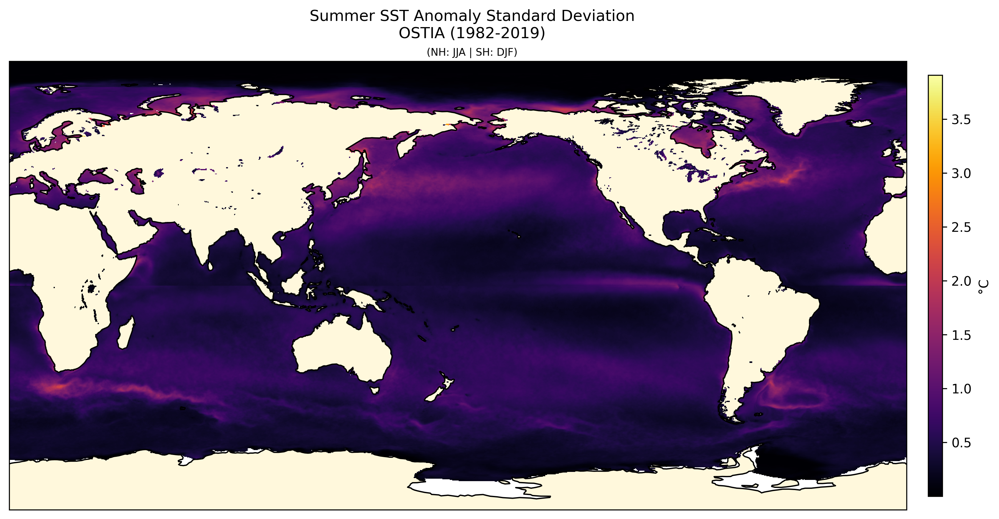

In [18]:
# --------------------------------------------------
# Summer Plot (NH=JJA, SH=DJF)
# --------------------------------------------------
fig = plt.figure(figsize=(12, 6), dpi=300)#,dpi=300)
ax2 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

summer_data = xr.where(std_jja_obs.lat >= 0, std_jja_obs, std_djf_obs)

im2 = summer_data.plot(ax=ax2, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_jja_obs), vmax=np.nanmax(std_jja_obs))

ax2.add_feature(cfeature.LAND, facecolor='cornsilk')
ax2.coastlines()
#ax2.set_title('Summer SST Anomaly Standard Deviation\n(NH: JJA | SH: DJF)', fontsize=12)

fig.text(s='Summer SST Anomaly Standard Deviation\nOSTIA (1982-2019)', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig.text(s='(NH: JJA | SH: DJF)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')

#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax2, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()

/home/b/b382616/opt/anaconda3/envs/py310_clone/lib/python3.10/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/opt/anaconda3/envs/py310_clone/lib/python3.10/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/opt/anaconda3/envs/py310_clone/lib/python3.10/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/opt/anaconda3/envs/py310_clone/lib/python3.10/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


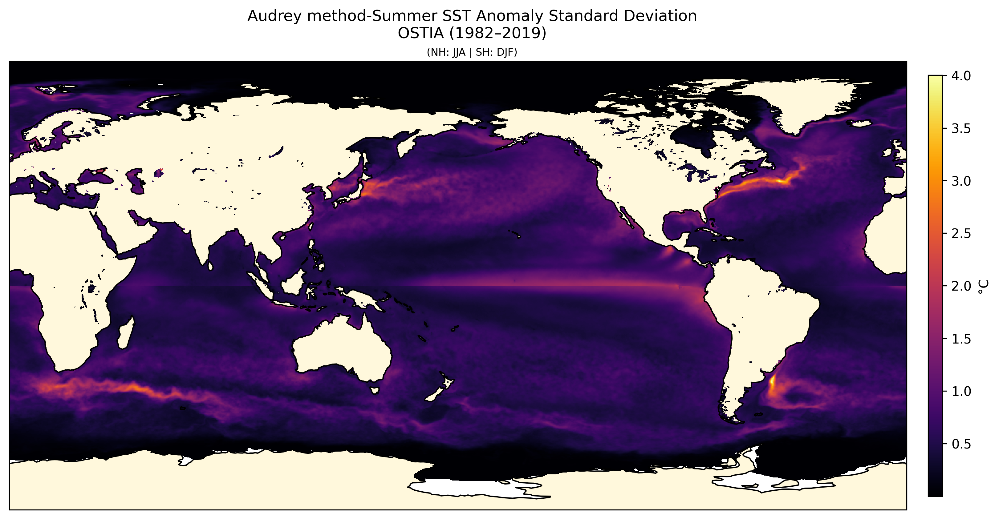

In [37]:
#AUDREY summer


# Create hemisphere-aware summer std field
summer_data = xr.where(aud_win.lat >= 0, aud_win, aud_summ)

# Plot
fig = plt.figure(figsize=(12, 6), dpi=300)
ax2 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

im2 = summer_data.plot(
    ax=ax2,
    transform=ccrs.PlateCarree(),
    cmap='inferno',
    add_colorbar=False,
    vmin=np.nanmin(summer_data),
    vmax=np.nanmax(summer_data)
)

ax2.add_feature(cfeature.LAND, facecolor='cornsilk')
ax2.coastlines()

fig.text(s='Audrey method-Summer SST Anomaly Standard Deviation\nOSTIA (1982–2019)', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig.text(s='(NH: JJA | SH: DJF)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')

plt.colorbar(im2, ax=ax2, orientation="vertical", shrink=0.8, pad=0.02, aspect=30, label='°C')
plt.tight_layout()
plt.show()


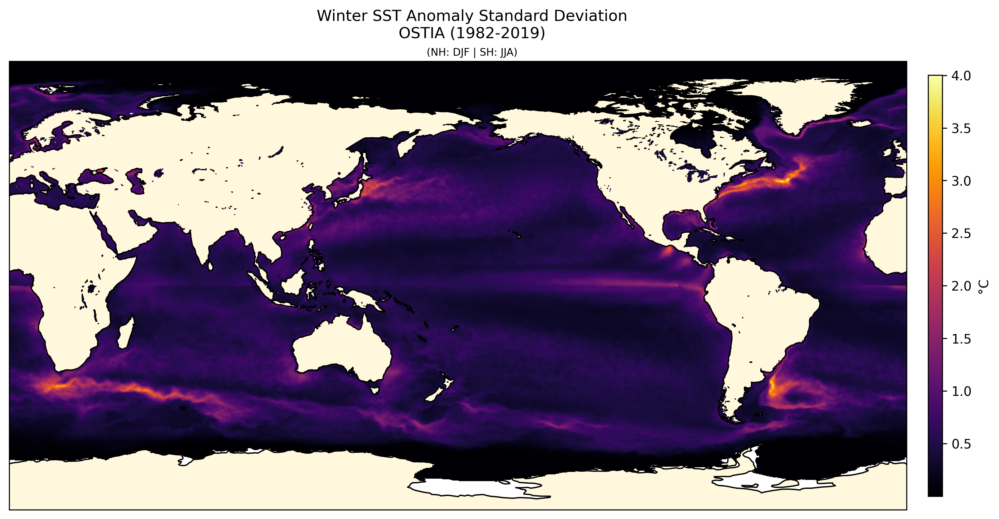

In [21]:
# --------------------------------------------------
# Winter Plot (NH=DJF, SH=JJA)
# --------------------------------------------------
fig1 = plt.figure(figsize=(12, 6), dpi=300)
ax1 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

# Combine hemispheres
winter_data = xr.where(std_djf_obs.lat >= 0, std_djf_obs, std_jja_obs)

# Plot
im1 = winter_data.plot(ax=ax1, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_djf_obs), vmax=np.nanmax(std_djf_obs))

# Decorations
ax1.add_feature(cfeature.LAND, facecolor='cornsilk')
ax1.coastlines()
#ax1.set_title('Winter SST Anomaly Standard Deviation\n(NH: DJF | SH: JJA)', fontsize=12)
fig1.text(s='Winter SST Anomaly Standard Deviation\nOSTIA (1982-2019)', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig1.text(s='(NH: DJF | SH: JJA)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')
#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax1, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()

/home/b/b382616/opt/anaconda3/envs/py310_clone/lib/python3.10/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/b/b382616/opt/anaconda3/envs/py310_clone/lib/python3.10/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


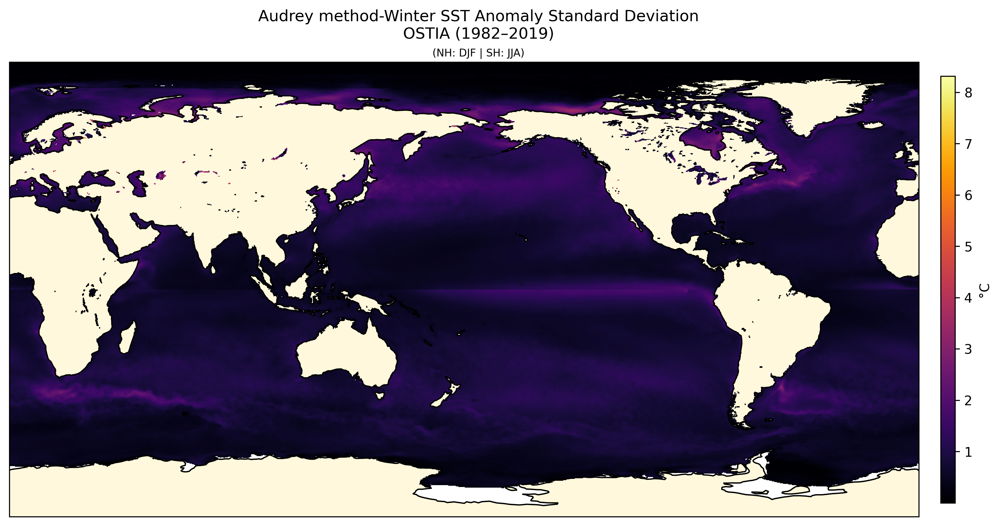

In [38]:
#AUDREY winter

# Create hemisphere-aware winter std field
winter_data = xr.where(aud_summ.lat >= 0, aud_summ, aud_win)

# Plot
fig = plt.figure(figsize=(12, 6), dpi=300)
ax = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

im = winter_data.plot(
    ax=ax,
    transform=ccrs.PlateCarree(),
    cmap='inferno',
    add_colorbar=False,
    vmin=np.nanmin(winter_data),
    vmax=np.nanmax(winter_data)
)

ax.add_feature(cfeature.LAND, facecolor='cornsilk')
ax.coastlines()

fig.text(s='Audrey method-Winter SST Anomaly Standard Deviation\nOSTIA (1982–2019)', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig.text(s='(NH: DJF | SH: JJA)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')

plt.colorbar(im, ax=ax, orientation="vertical", shrink=0.8, pad=0.02, aspect=30, label='°C')
plt.tight_layout()
plt.show()


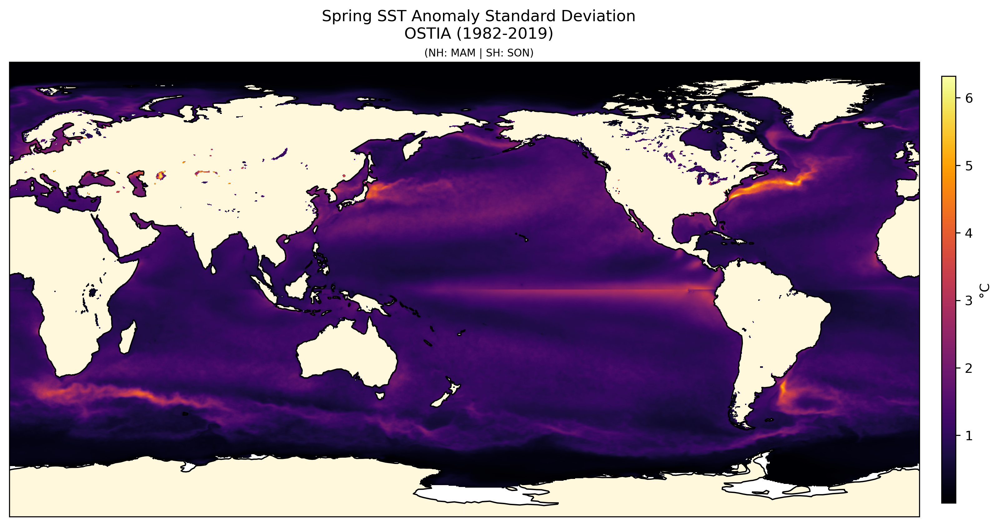

In [7]:
# --------------------------------------------------
# Spring Plot (NH=MAM, SH=SON)
# --------------------------------------------------
fig3 = plt.figure(figsize=(12, 6), dpi=300)
ax3 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

spring_data = xr.where(std_mam_obs.lat >= 0, std_mam_obs, std_son_obs)

im3 = spring_data.plot(ax=ax3, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_mam_obs), vmax=np.nanmax(std_mam_obs))

# Decorations
ax3.add_feature(cfeature.LAND, facecolor='cornsilk')
ax3.coastlines()
#ax3.set_title('Spring SST Anomaly Standard Deviation\n(NH: MAM | SH: SON)', fontsize=12)
#plt.text(15,-0.02,'ICON phase 1 control run', fontsize=12)

fig3.text(s='Spring SST Anomaly Standard Deviation\nOSTIA (1982-2019)', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig3.text(s='(NH: MAM | SH: SON)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')

#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax3, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()


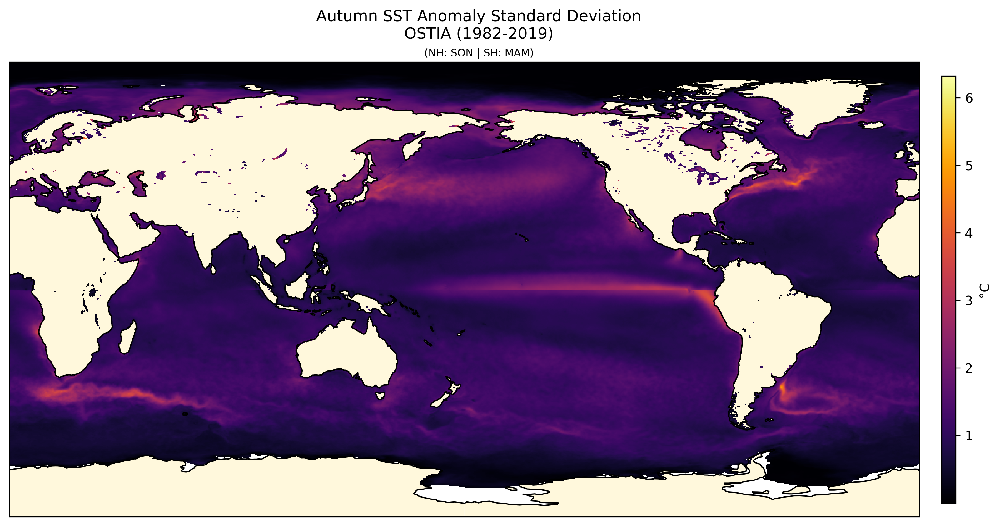

In [8]:

# --------------------------------------------------
# Autumn Plot (NH=SON, SH=MAM)
# --------------------------------------------------
fig4 = plt.figure(figsize=(12, 6), dpi=300)
ax4 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

autumn_data = xr.where(std_son_obs.lat >= 0, std_son_obs, std_mam_obs)

im4 = autumn_data.plot(ax=ax4, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_son_obs), vmax=np.nanmax(std_son_obs))

# Decorations
ax4.add_feature(cfeature.LAND, facecolor='cornsilk')
ax4.coastlines()
#ax4.set_title('Autumn SST Anomaly Standard Deviation\n(NH: SON | SH: MAM)', fontsize=12)
fig4.text(s='Autumn SST Anomaly Standard Deviation\nOSTIA (1982-2019)', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig4.text(s='(NH: SON | SH: MAM)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')
#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax4, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()

## ICON

In [9]:

# Define trimesters and their months
trimesters = {
    'DJF': [12, 1, 2],
    'MAM': [3, 4, 5],
    'JJA': [6, 7, 8],
    'SON': [9, 10, 11]
}

# Calculate and save trimester standard deviations
#for trm, months in trimesters.items():
#    # Mask months while handling December (year boundary)
#    ssta_trm = ssta.sel(time=ssta.time.dt.month.isin(months))
#    std_trm = ssta_trm.std(dim='time', keep_attrs=True)
#    std_trm=std_trm.to_netcdf(f'ssta_std_{trm}.nc')

# Load precomputed standard deviations
std_djf = xr.open_dataarray('ssta_std_DJF.nc')
std_djf=std_djf.compute()
std_mam = xr.open_dataarray('ssta_std_MAM.nc')
std_mam=std_mam.compute()
std_jja = xr.open_dataarray('ssta_std_JJA.nc')
std_jja=std_jja.compute()
std_son = xr.open_dataarray('ssta_std_SON.nc')
std_son=std_son.compute()


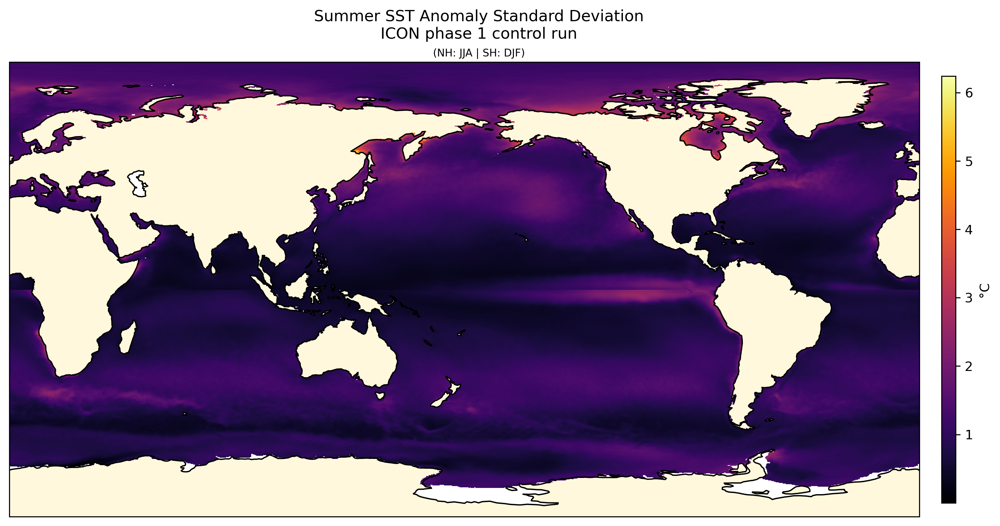

In [15]:
# --------------------------------------------------
# Summer Plot (NH=JJA, SH=DJF)
# --------------------------------------------------
fig = plt.figure(figsize=(12, 6), dpi=300)#,dpi=300)
ax2 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

summer_data = xr.where(std_jja.lat >= 0, std_jja, std_djf)

im2 = summer_data.plot(ax=ax2, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_jja), vmax=np.nanmax(std_jja))

ax2.add_feature(cfeature.LAND, facecolor='cornsilk')
ax2.coastlines()
#ax2.set_title('Summer SST Anomaly Standard Deviation\n(NH: JJA | SH: DJF)', fontsize=12)

fig.text(s='Summer SST Anomaly Standard Deviation\nICON phase 1 control run', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig.text(s='(NH: JJA | SH: DJF)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')

#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax2, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()

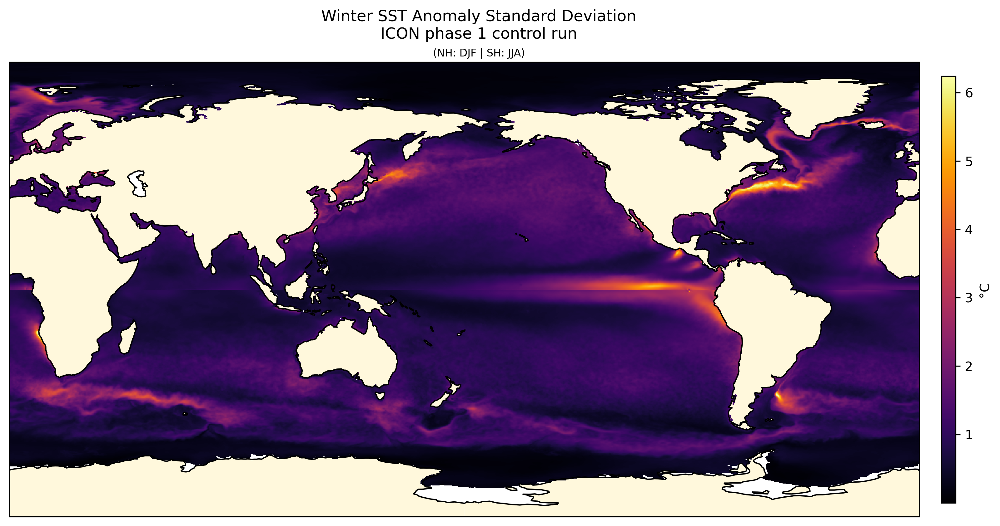

In [11]:
# --------------------------------------------------
# Winter Plot (NH=DJF, SH=JJA)
# --------------------------------------------------
fig1 = plt.figure(figsize=(12, 6), dpi=300)
ax1 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

# Combine hemispheres
winter_data = xr.where(std_djf.lat >= 0, std_djf, std_jja)

# Plot
im1 = winter_data.plot(ax=ax1, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_djf), vmax=np.nanmax(std_djf))

# Decorations
ax1.add_feature(cfeature.LAND, facecolor='cornsilk')
ax1.coastlines()
#ax1.set_title('Winter SST Anomaly Standard Deviation\n(NH: DJF | SH: JJA)', fontsize=12)
fig1.text(s='Winter SST Anomaly Standard Deviation\nICON phase 1 control run', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig1.text(s='(NH: DJF | SH: JJA)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')
#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax1, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()

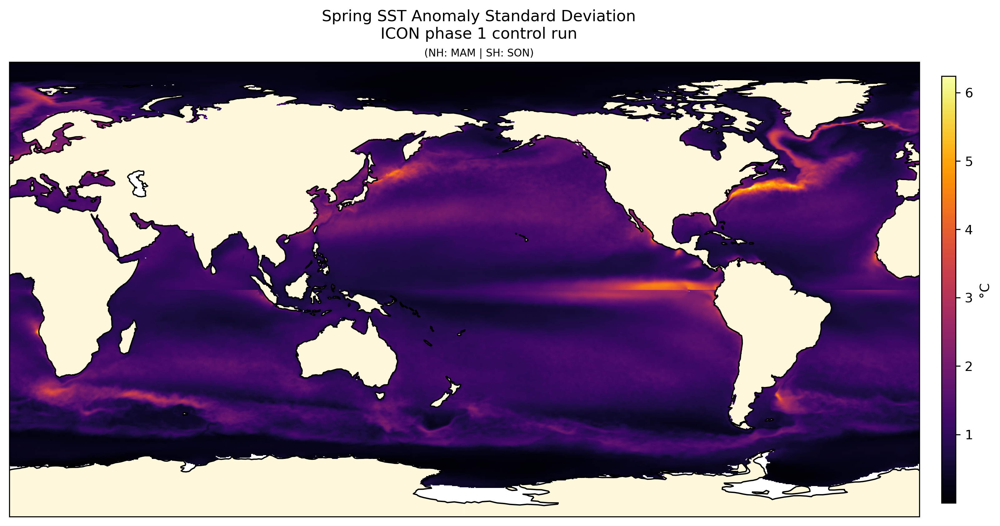

In [12]:
# --------------------------------------------------
# Spring Plot (NH=MAM, SH=SON)
# --------------------------------------------------
fig3 = plt.figure(figsize=(12, 6), dpi=300)
ax3 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

spring_data = xr.where(std_mam.lat >= 0, std_mam, std_son)

im3 = spring_data.plot(ax=ax3, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_mam), vmax=np.nanmax(std_mam))

# Decorations
ax3.add_feature(cfeature.LAND, facecolor='cornsilk')
ax3.coastlines()
#ax3.set_title('Spring SST Anomaly Standard Deviation\n(NH: MAM | SH: SON)', fontsize=12)
#plt.text(15,-0.02,'ICON phase 1 control run', fontsize=12)

fig3.text(s='Spring SST Anomaly Standard Deviation\nICON phase 1 control run', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig3.text(s='(NH: MAM | SH: SON)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')

#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax3, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()


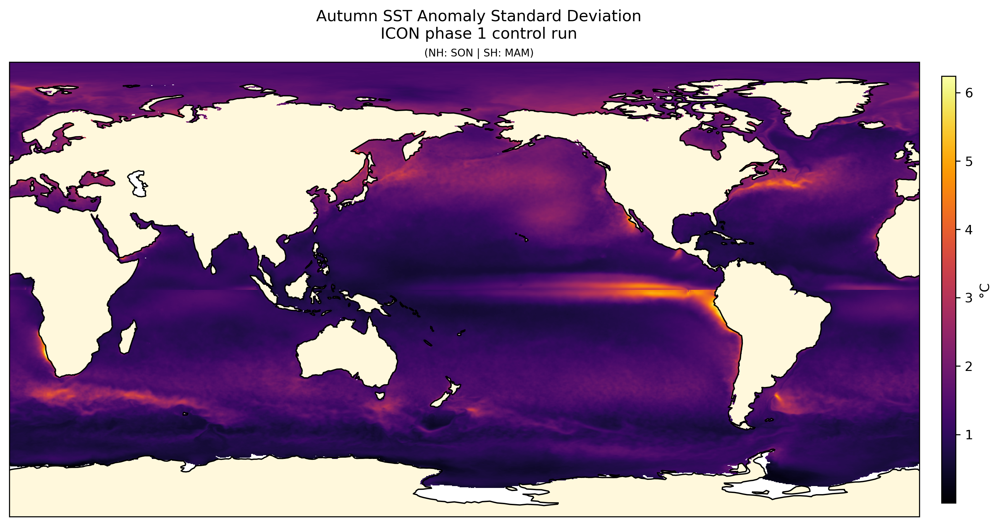

In [13]:

# --------------------------------------------------
# Autumn Plot (NH=SON, SH=MAM)
# --------------------------------------------------
fig4 = plt.figure(figsize=(12, 6), dpi=300)
ax4 = plt.subplot(projection=ccrs.PlateCarree(central_longitude=180))

autumn_data = xr.where(std_son.lat >= 0, std_son, std_mam)

im4 = autumn_data.plot(ax=ax4, transform=ccrs.PlateCarree(),
                      cmap='inferno', add_colorbar=False,
                      vmin=np.nanmin(std_son), vmax=np.nanmax(std_son))

# Decorations
ax4.add_feature(cfeature.LAND, facecolor='cornsilk')
ax4.coastlines()
#ax4.set_title('Autumn SST Anomaly Standard Deviation\n(NH: SON | SH: MAM)', fontsize=12)
fig4.text(s='Autumn SST Anomaly Standard Deviation\nICON phase 1 control run', x=0.43, y=0.97, fontsize=12, ha='center', va='center')
fig4.text(s='(NH: SON | SH: MAM)', x=0.43, y=0.92, fontsize=8, ha='center', va='center')
#ax2.plot([-180, 180], [0, 0], color='black', linewidth=1, transform=ccrs.PlateCarree())
plt.colorbar(im2, ax=ax4, orientation="vertical", shrink=0.8, pad=0.02, aspect=30,label='°C')
plt.tight_layout()
#plt.savefig('summer_std.png', dpi=300, bbox_inches='tight')
plt.show()